# JamUNet model trained with the temporal dataset - testing and visualisation

This notebook was used for testing the model, computing the metric scores, and visualising the predictions.

In [1]:
%cd ..

c:\Users\magherin\Desktop\jamuna_morpho


In [2]:
# reload modules to avoid restarting the notebook every time these are updated

%load_ext autoreload
%autoreload 2

In [3]:
# import modules 

import torch
import copy
import time

from torch.utils.data import DataLoader

from model.train_eval import * 
from preprocessing.dataset_generation import create_split_dataset

from postprocessing.metrics import *
from postprocessing.plot_results import *
from postprocessing.save_results import load_model

# Enable interactive widgets in Jupyter Notebook
%matplotlib inline
%matplotlib widget

In [4]:
# set the device where operations are performed
# if only one GPU is present you might need to remove the index "0" 
# torch.device('cuda:0') --> torch.device('cuda') / torch.cuda.get_device_name(0) --> torch.cuda.get_device_name() 

if torch.cuda.is_available():
    device = torch.device('cuda:0')
    print("CUDA Device Count: ", torch.cuda.device_count())
    print("CUDA Device Name: ", torch.cuda.get_device_name(0))
else:
    device = 'cpu'
    
print(f'Using device: {device}')

Using device: cpu


In [5]:
# set common keys required for functions

train = 'training'
val = 'validation'
test = 'testing'

In [6]:
# by default March images are used 
# if another month is used change the number (available months: 1-4)

month = 3

In [7]:
# load all datasets
dir_folders = r'data\satellite'
dtype=torch.float32

val_set = create_split_dataset(month, use_dataset=val, dir_folders=dir_folders, device=device, dtype=dtype)
test_set = create_split_dataset(month, use_dataset=test, dir_folders=dir_folders, device=device, dtype=dtype)

c:\Users\magherin\AppData\Local\anaconda3\envs\braided\lib\site-packages\osgeo\gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


**<span style="color:red">Attention!</span> Always remember to load the correct <code>save_path</code> file before running the following cells, in order to match all keys successfully when loading the model.**

In [8]:
# load model with min val loss

save_path_loss = rf'model\models_trained\UNet3D_temporal_bloss_month3_4dwns_8ihiddim_3ker_maxpool_0.05ilr_15step_0.75gamma_16batch_100epochs_0.5wthr.pth'

In [9]:
# load model with max recall

save_path_recall = rf'model\models_trained\UNet3D_temporal_brecall_month3_4dwns_8ihiddim_3ker_maxpool_0.05ilr_15step_0.75gamma_16batch_100epochs_0.5wthr.pth'

In [10]:
# load JamUNet architecture

from model.st_unet.st_unet import *

n_channels = test_set[0][0].shape[0]
n_classes = 1
init_hid_dim = 8
kernel_size = 3
pooling = 'max'

model_loss = UNet3D(n_channels=n_channels, n_classes=n_classes, init_hid_dim=init_hid_dim, 
                         kernel_size=kernel_size, pooling=pooling, bilinear=False, drop_channels=False).to(device)

In [11]:
# deepcopy the model to avoid overwriting

model_recall = copy.deepcopy(model_loss)

In [12]:
loss_f = 'BCE'
batch_size = 16

# dataloaders to input data to the model in batches -- see note above

val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)

In [13]:
# load model with min val loss

load_model(model_loss, save_path_loss, device=device)

<All keys matched successfully>

In [15]:
sample = 15

input_img = test_set[sample][0].unsqueeze(0).to(device)
target_img = test_set[sample][1].to(device)

prediction = model_loss(input_img).detach().to(device)
# check that the predictions from the same sample are different from those of the max recall model
print(prediction)

tensor([[[[0.0276, 0.0067, 0.0077,  ..., 0.0111, 0.0101, 0.0316],
          [0.0059, 0.0007, 0.0008,  ..., 0.0017, 0.0014, 0.0070],
          [0.0057, 0.0006, 0.0009,  ..., 0.0020, 0.0017, 0.0081],
          ...,
          [0.0053, 0.0006, 0.0008,  ..., 0.0359, 0.0162, 0.0282],
          [0.0056, 0.0006, 0.0008,  ..., 0.0169, 0.0084, 0.0191],
          [0.0250, 0.0052, 0.0063,  ..., 0.0377, 0.0244, 0.0467]]]])


In [16]:
# load model with max recall

load_model(model_recall, save_path_recall, device=device)

<All keys matched successfully>

In [17]:
sample = 15

input_img = test_set[sample][0].unsqueeze(0).to(device)
target_img = test_set[sample][1].to(device)

prediction = model_recall(input_img).detach().to(device)
# check that the predictions from the same sample are different from those of the min loss model
print(prediction)

tensor([[[[0.0749, 0.0255, 0.0199,  ..., 0.0202, 0.0273, 0.0847],
          [0.0237, 0.0045, 0.0025,  ..., 0.0025, 0.0039, 0.0256],
          [0.0198, 0.0025, 0.0014,  ..., 0.0014, 0.0026, 0.0212],
          ...,
          [0.0186, 0.0028, 0.0015,  ..., 0.0024, 0.0036, 0.0226],
          [0.0261, 0.0035, 0.0025,  ..., 0.0032, 0.0049, 0.0279],
          [0.0753, 0.0250, 0.0188,  ..., 0.0216, 0.0274, 0.0740]]]])


In [18]:
# load losses and metrics saved during training and validation for plotting

losses_metrics = load_losses_metrics(r'model\losses_metrics\UNet2D_temporal_losses&metrics_month3_4dwns_8ihiddim_3ker_maxpool_0.05ilr_15step_0.75gamma_16batch_100epochs_0.5wthr.csv')
train_losses, val_losses = losses_metrics['Training loss'], losses_metrics['Validation loss']
metrics = [losses_metrics[losses_metrics.columns[i]].tolist() for i in range(2, len(losses_metrics.columns))]
plot_losses_metrics(train_losses, val_losses, metrics, model_recall, loss_f=loss_f, save_name='temporal_dataset_lossmetrics')

In [19]:
total_losses_metrics_dataset(model_loss, test_set, device=device)

Average metrics for test dataset using min loss model:

BCE loss:          1.550e-01
Accuracy:          0.926
Precision:         0.645
Recall:            0.629
F1 score:          0.636
CSI score:         0.467


In [20]:
total_losses_metrics_dataset(model_recall, test_set, model_type='max recall', device=device)

Average metrics for test dataset using max recall model:

BCE loss:          1.930e-01
Accuracy:          0.910
Precision:         0.547
Recall:            0.769
F1 score:          0.639
CSI score:         0.470


In [21]:
# check metrics with optimal threshold according to ROC and PR curves

new_thr = 0.402
total_losses_metrics_dataset(model_loss, test_set, water_threshold=new_thr, device=device)
total_losses_metrics_dataset(model_recall, test_set, water_threshold=new_thr, model_type='max recall', device=device)

Average metrics for test dataset using min loss model:

BCE loss:          1.550e-01
Accuracy:          0.921
Precision:         0.595
Recall:            0.744
F1 score:          0.660
CSI score:         0.494
Average metrics for test dataset using max recall model:

BCE loss:          1.930e-01
Accuracy:          0.894
Precision:         0.495
Recall:            0.861
F1 score:          0.628
CSI score:         0.458


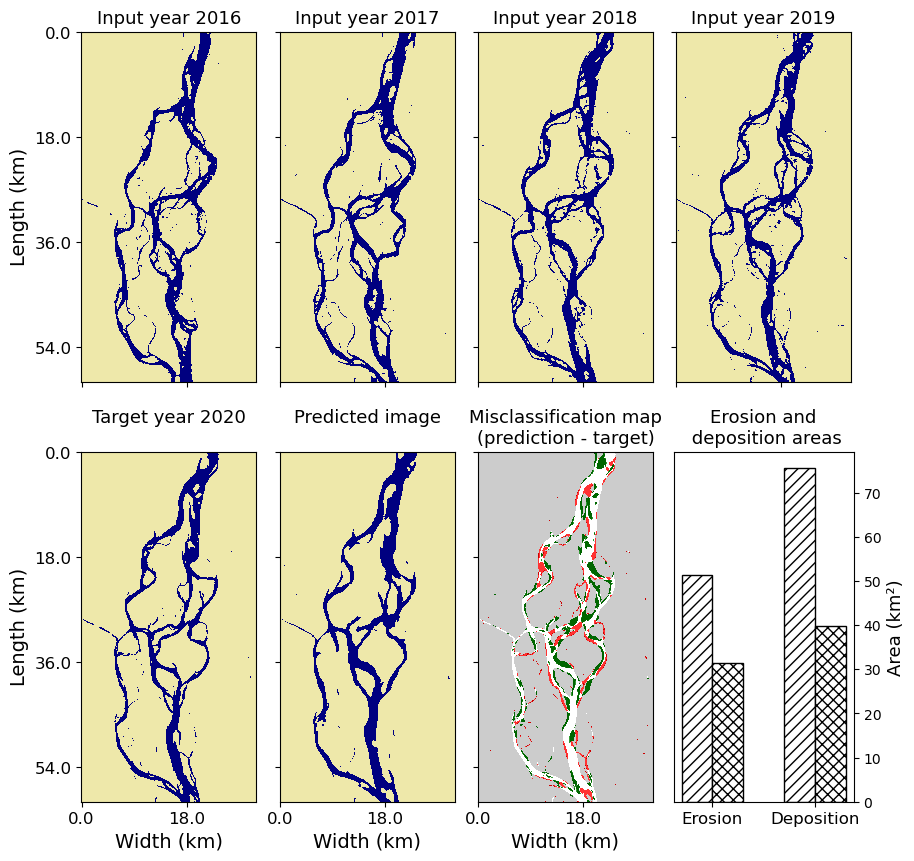

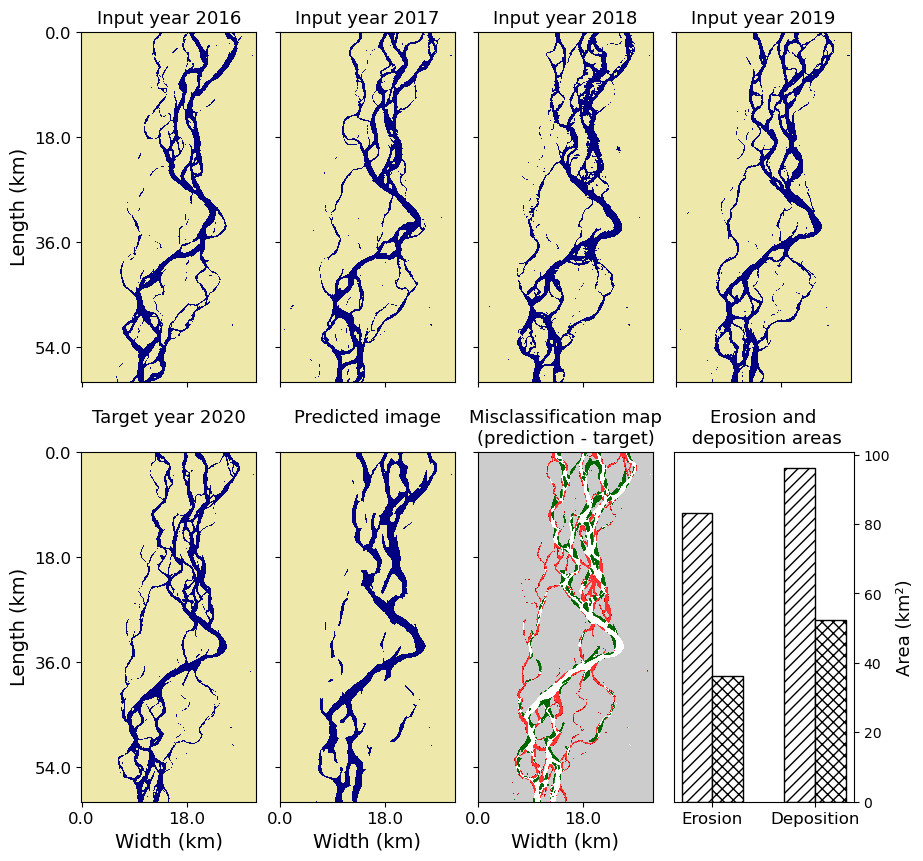

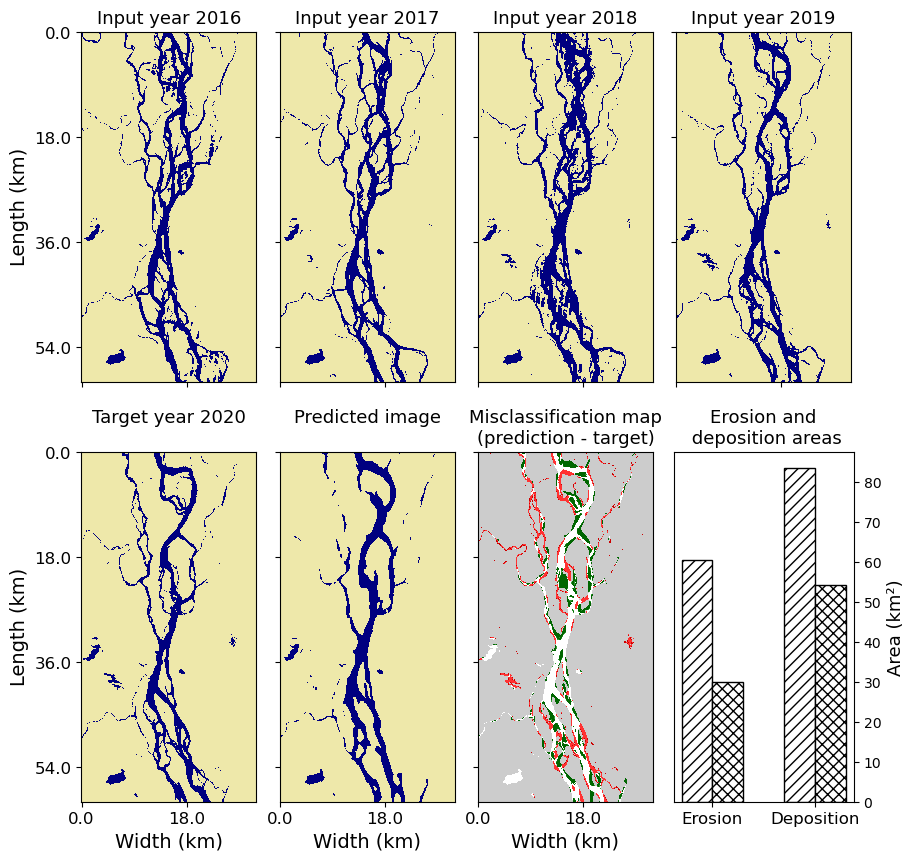

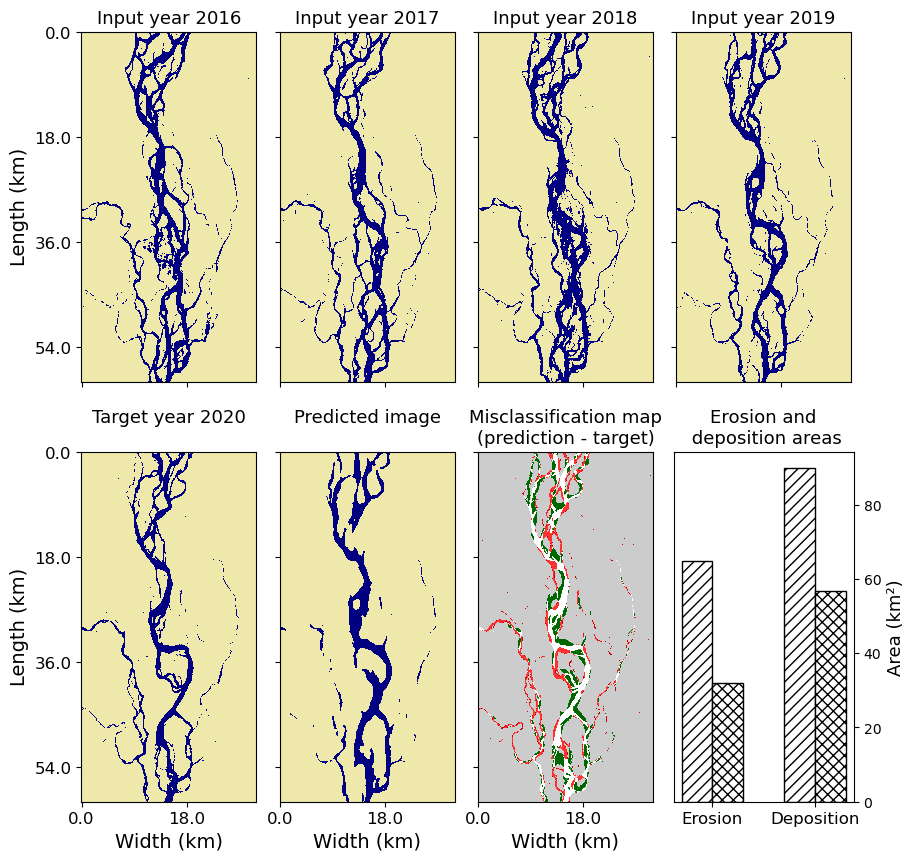

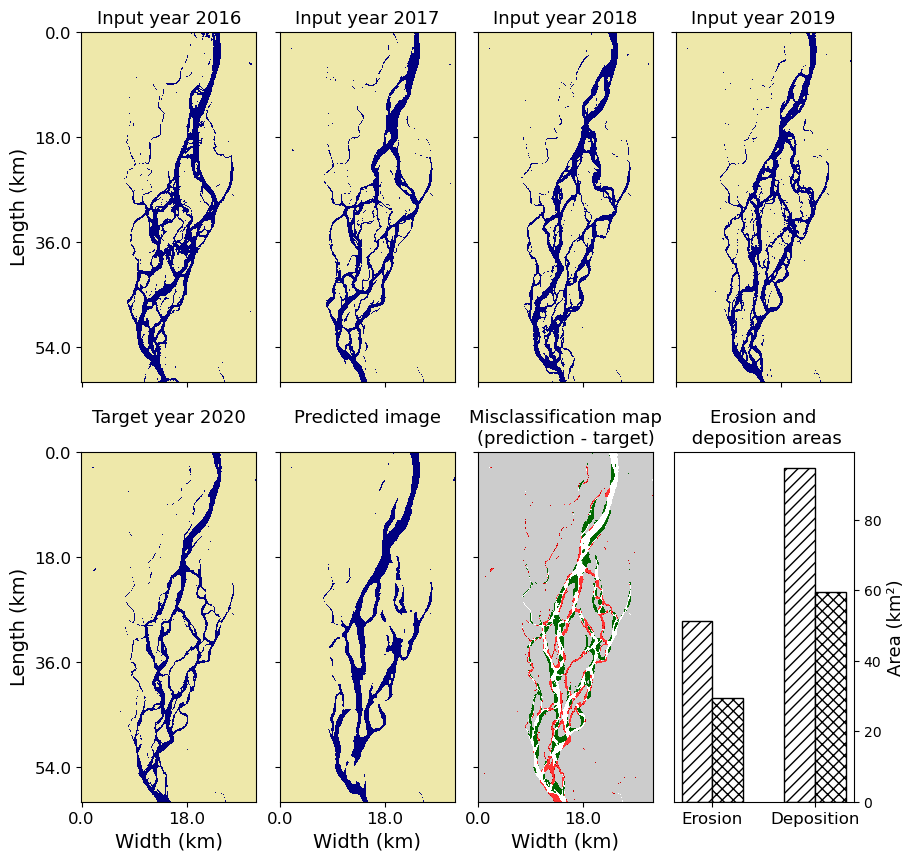

...

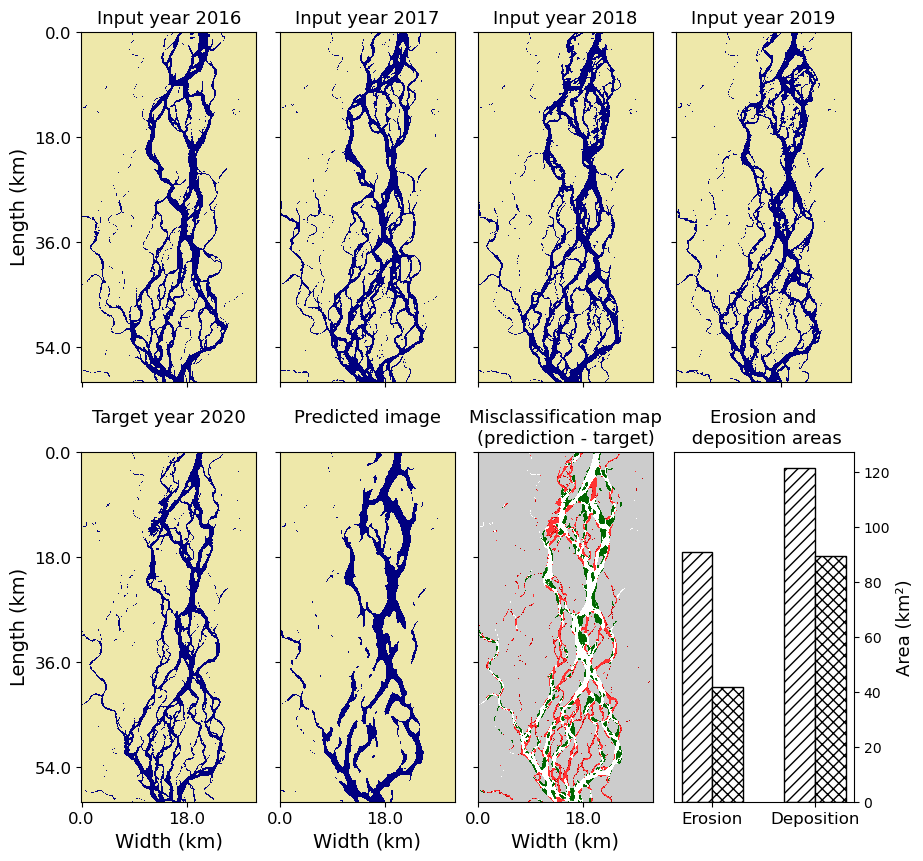

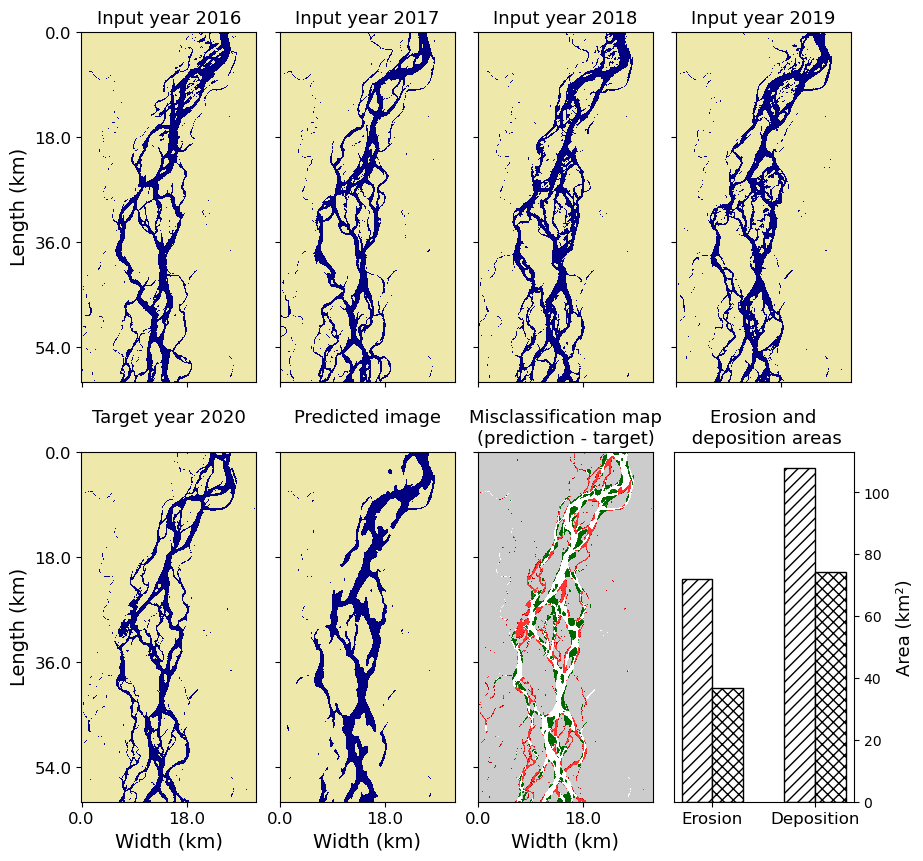

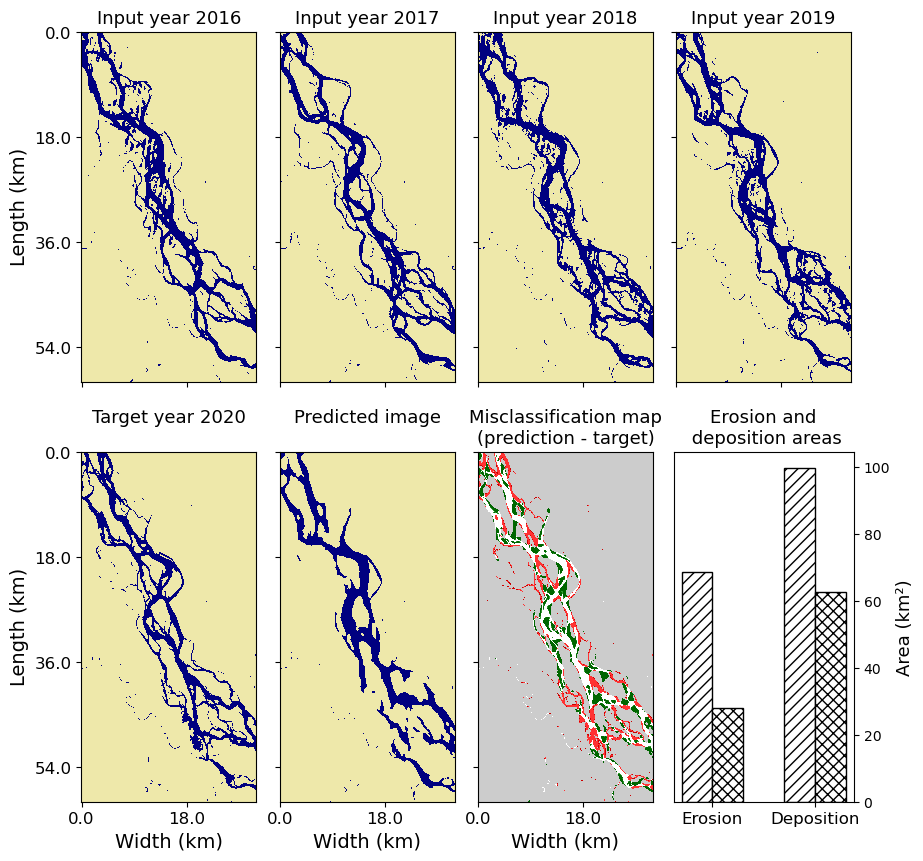

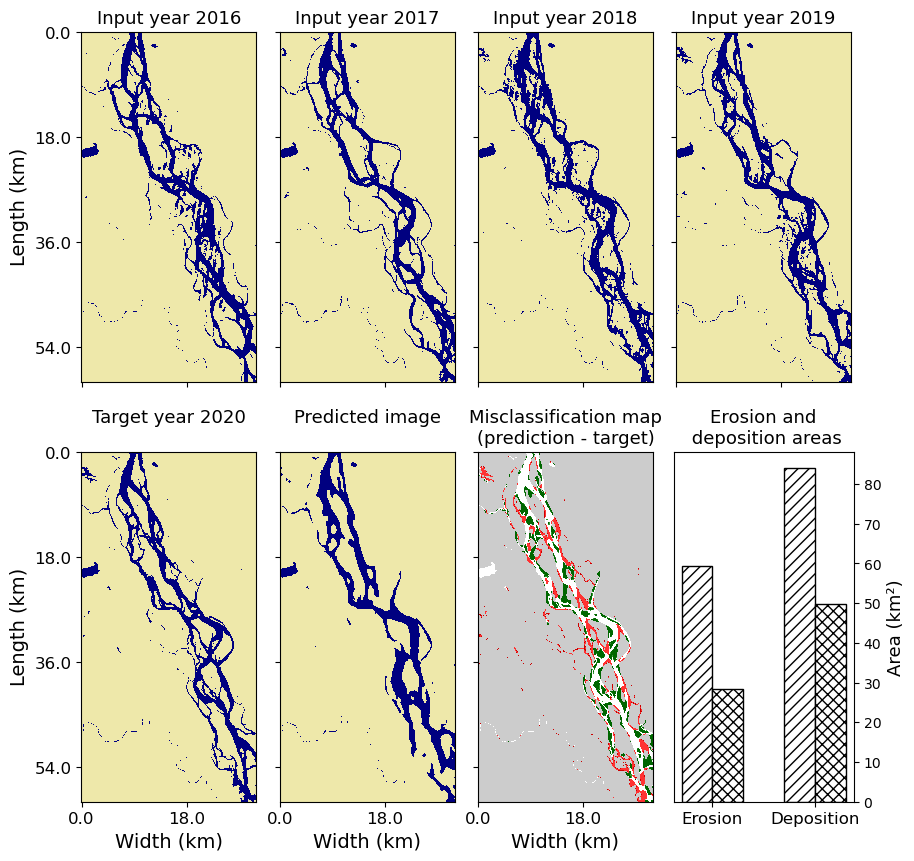

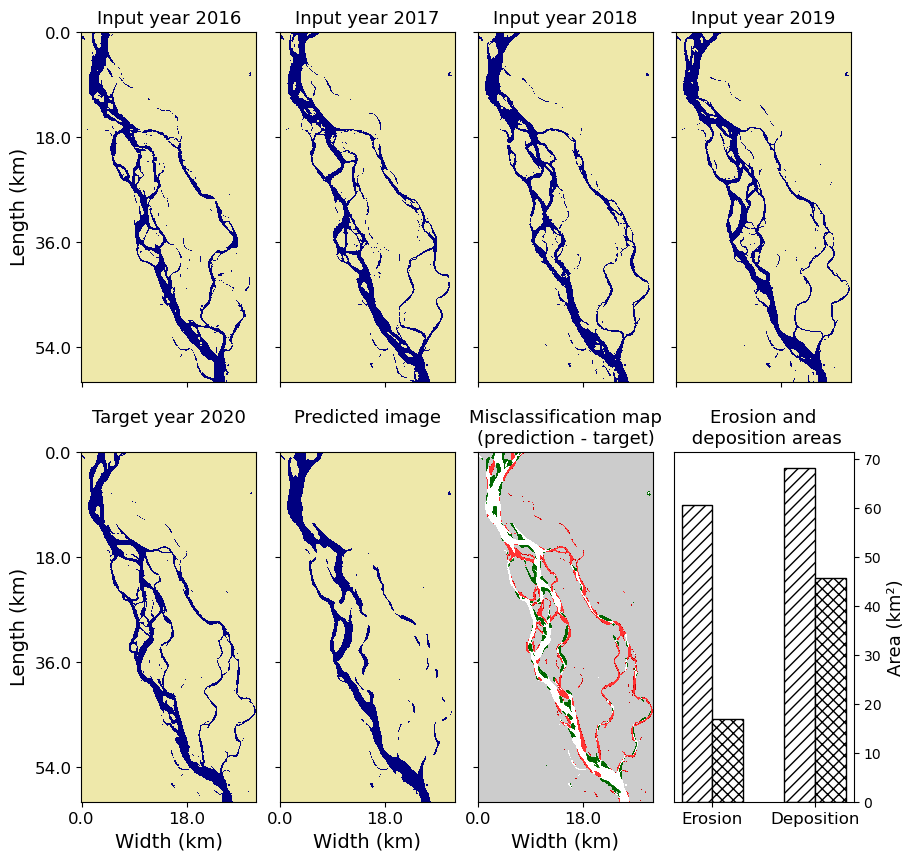

In [24]:
%matplotlib inline
for i in range(len(test_set)):
    show_evolution_nolegend(i, test_set, model_loss, device=device, spatial_temporal='temporal', save_img=True)

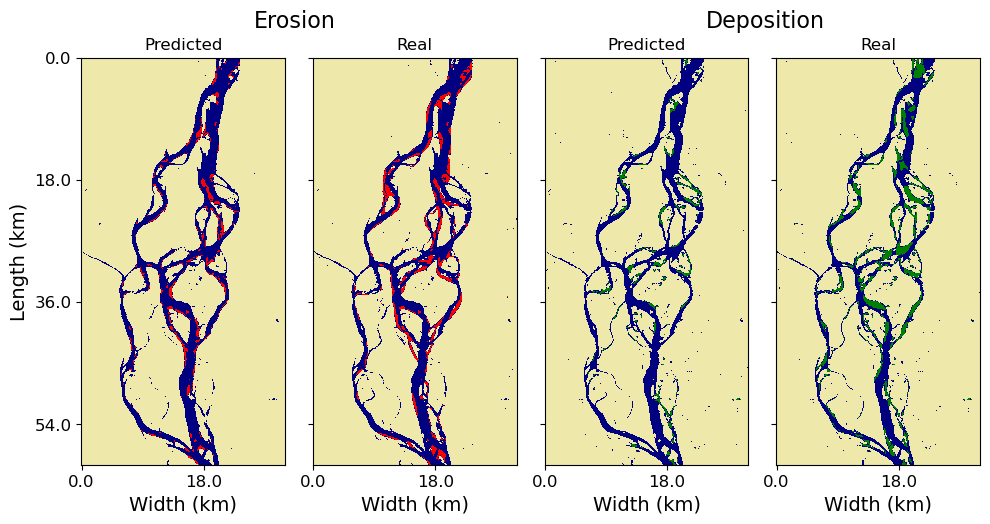

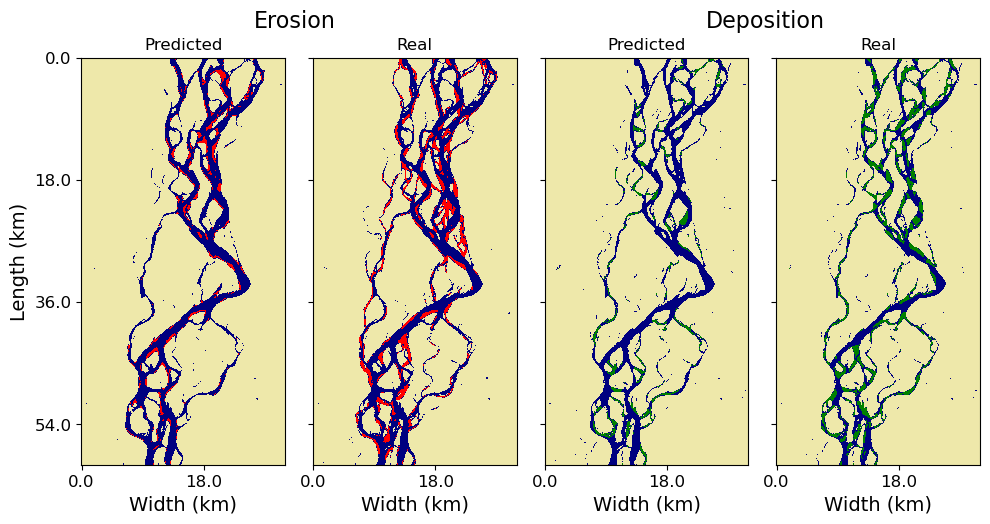

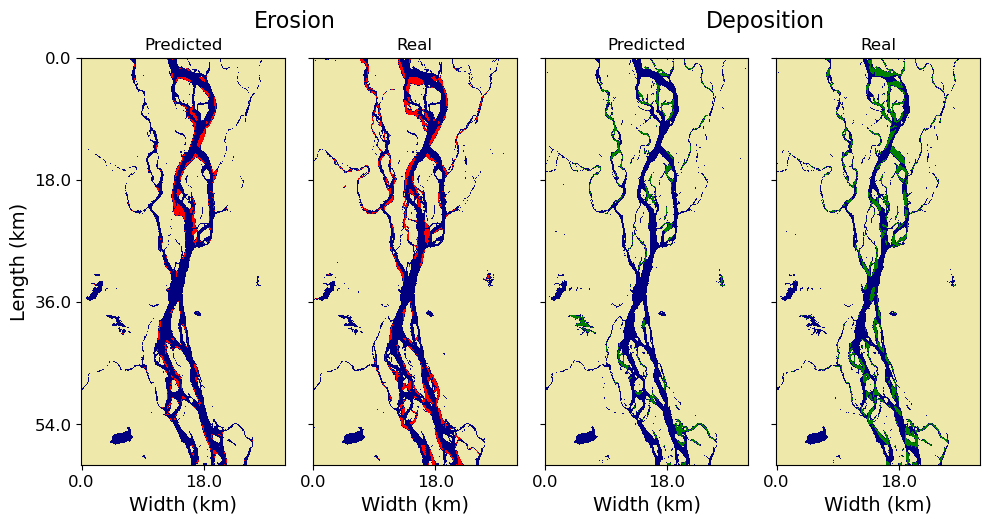

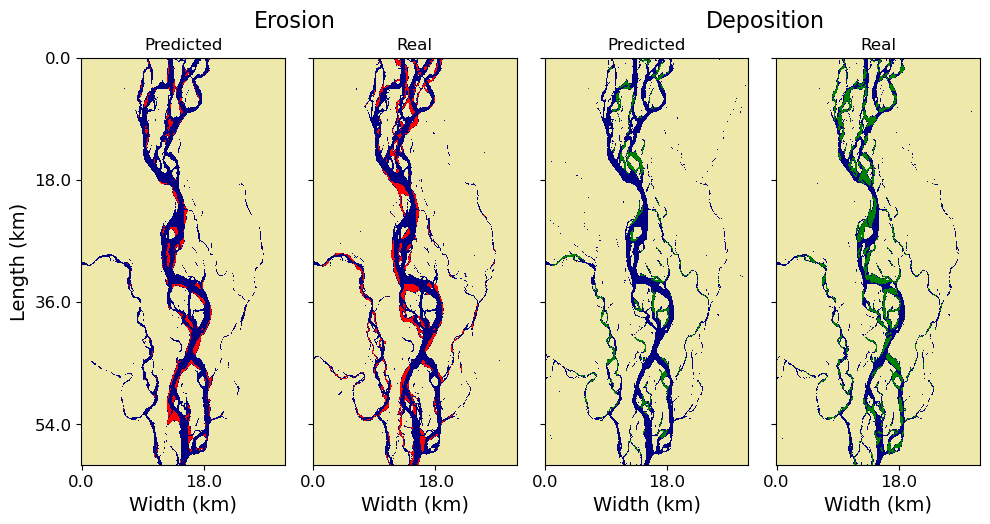

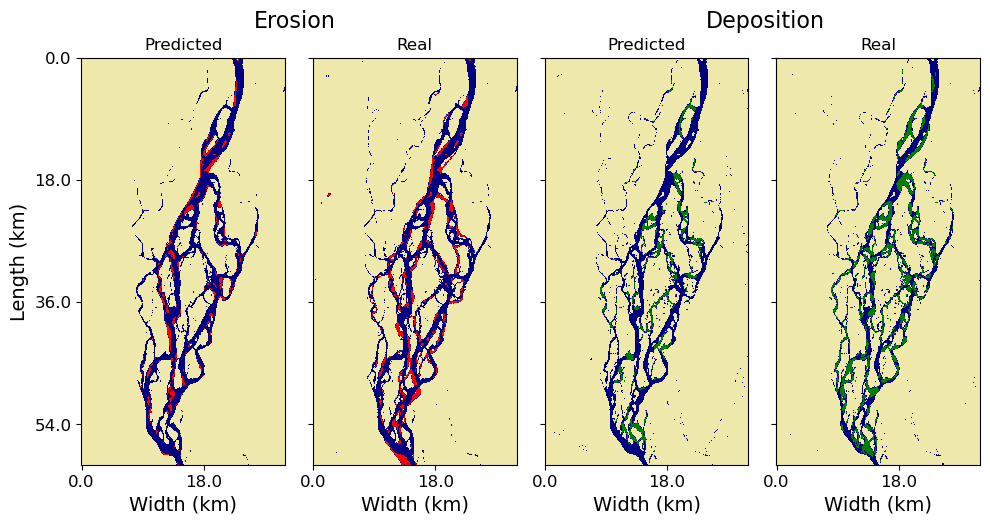

...

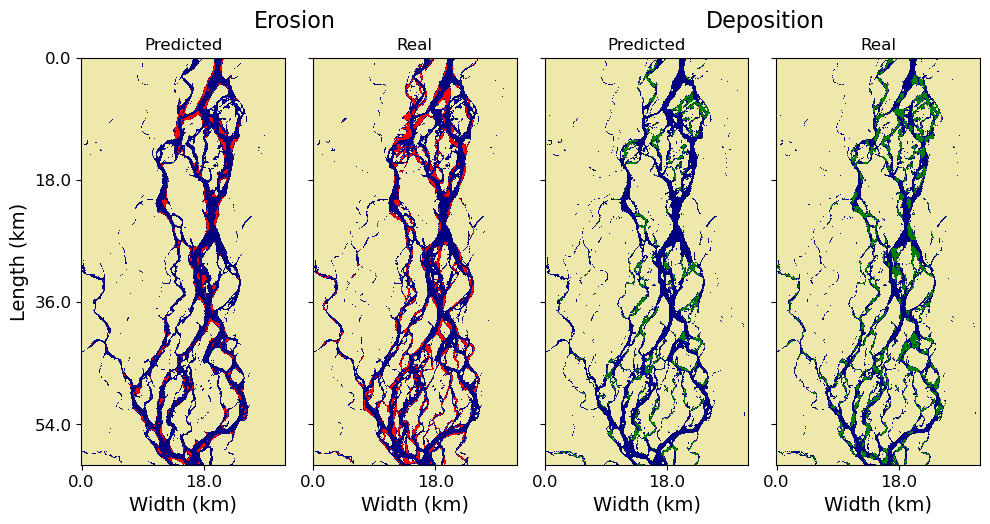

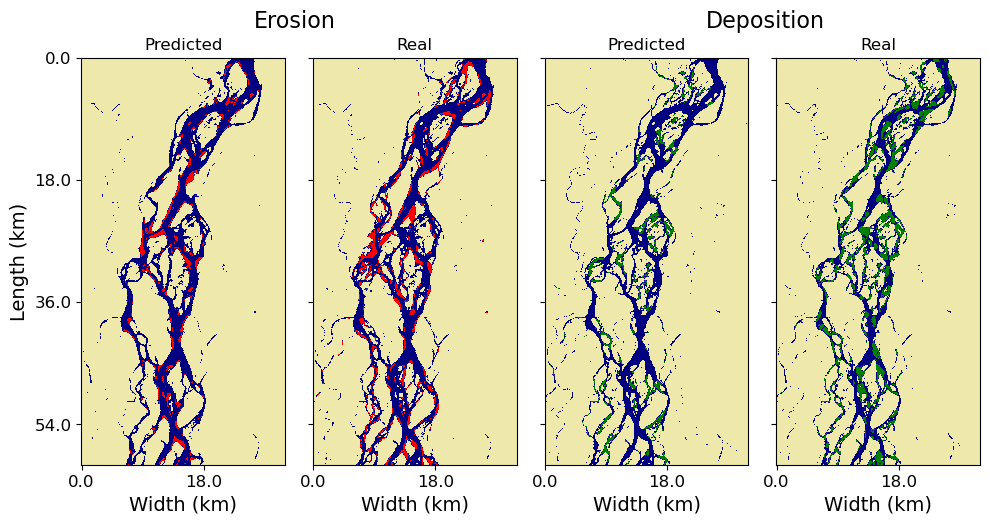

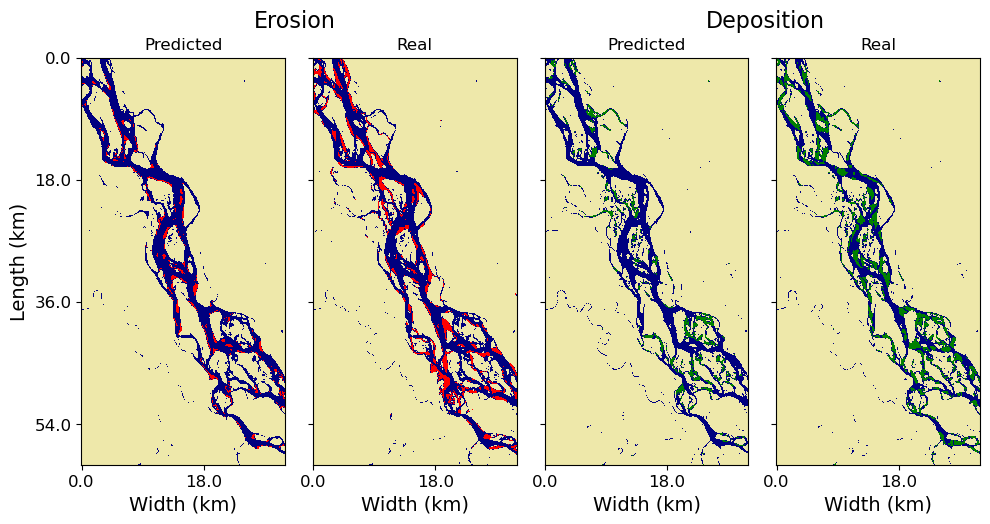

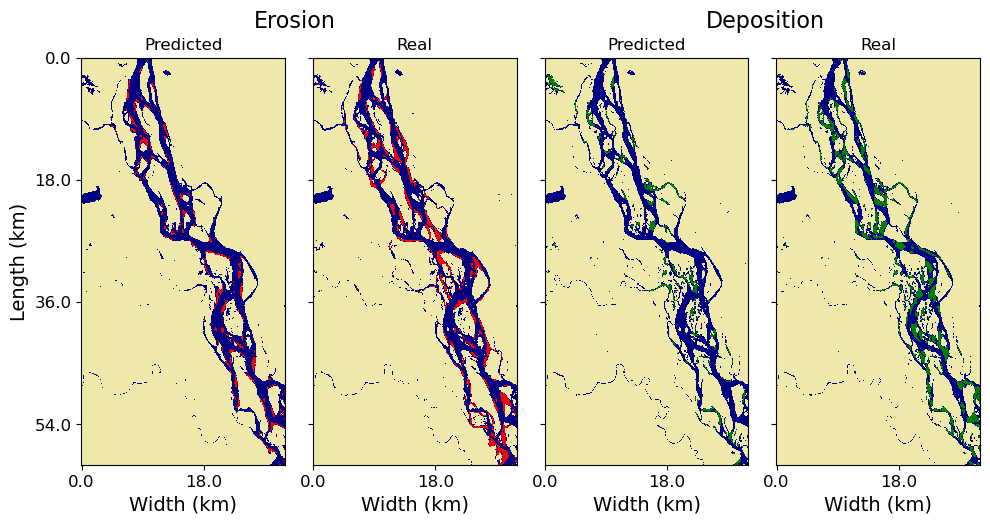

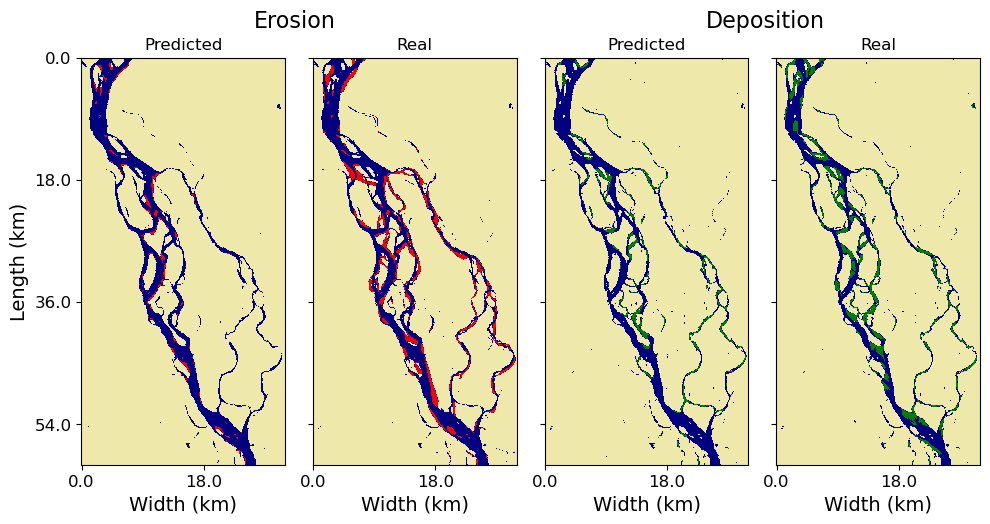

In [22]:
%matplotlib inline
for i in range(len(test_set)):
    erosion_sites(model_loss, test_set, i, device=device, spatial_temporal='temporal', save_img=False)

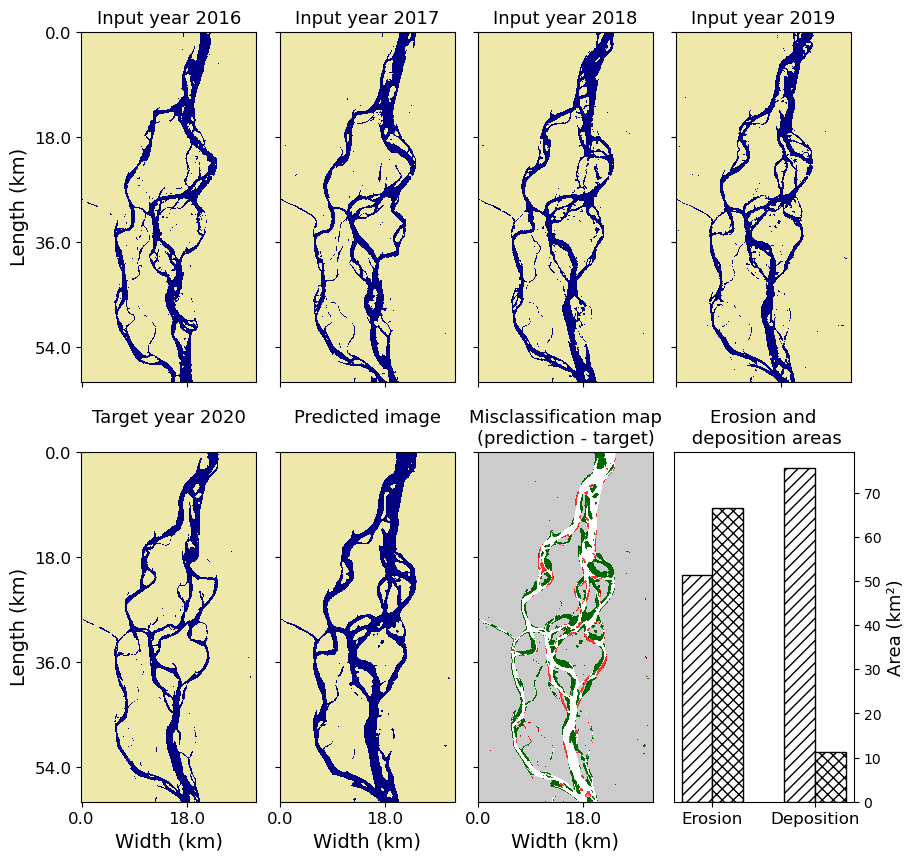

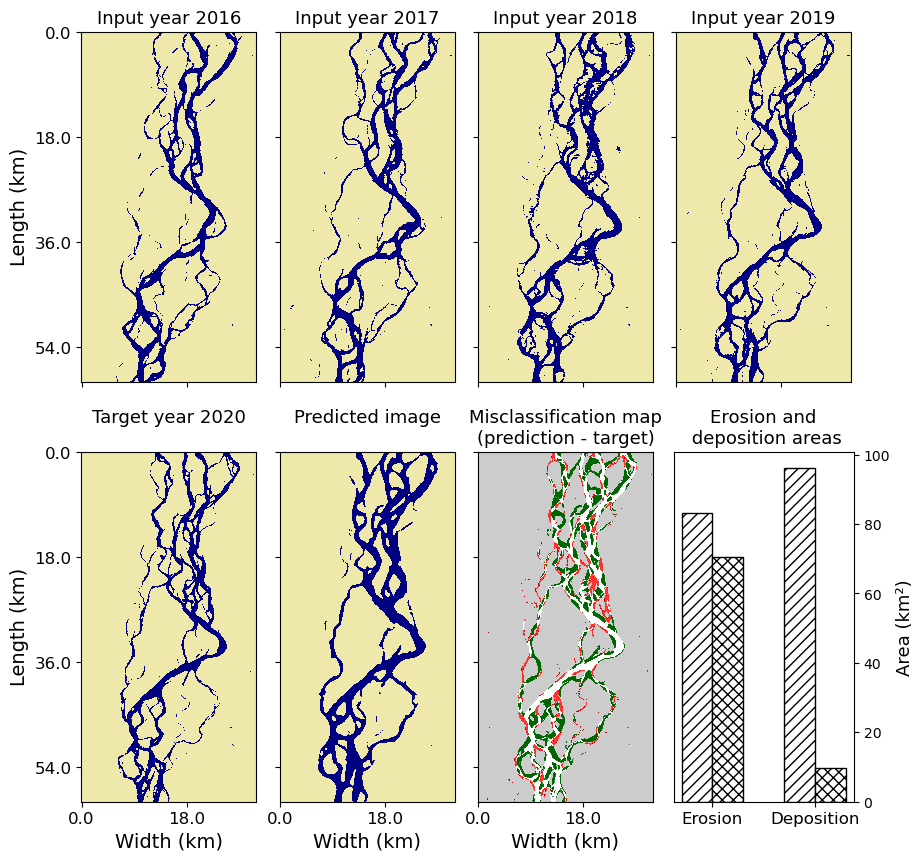

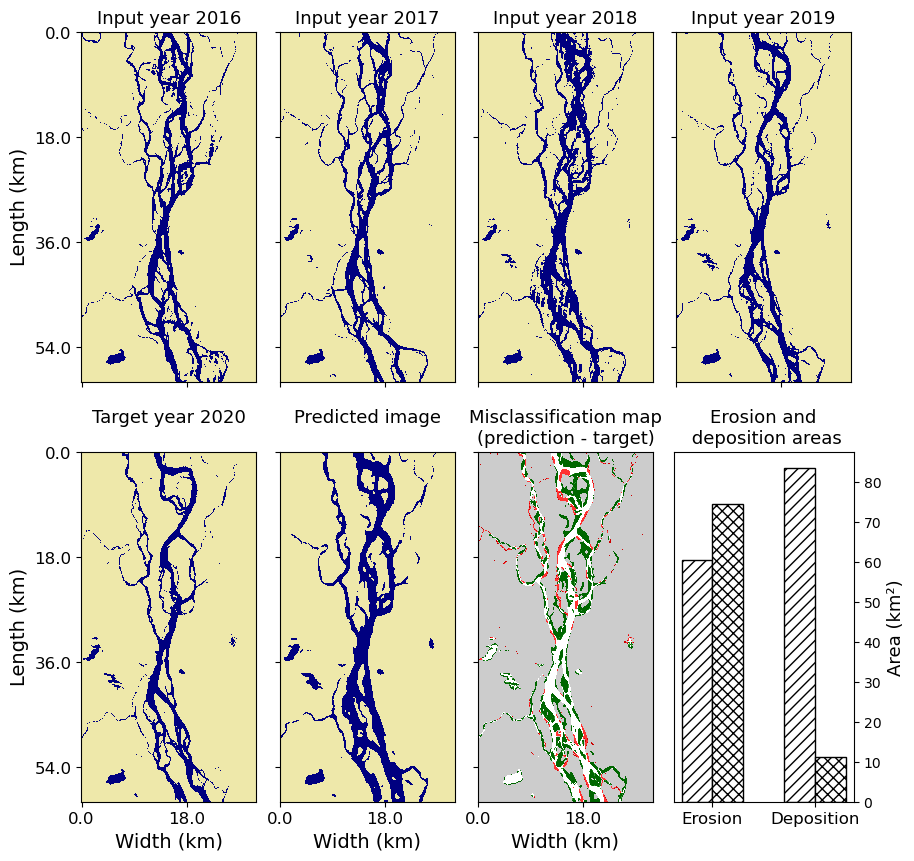

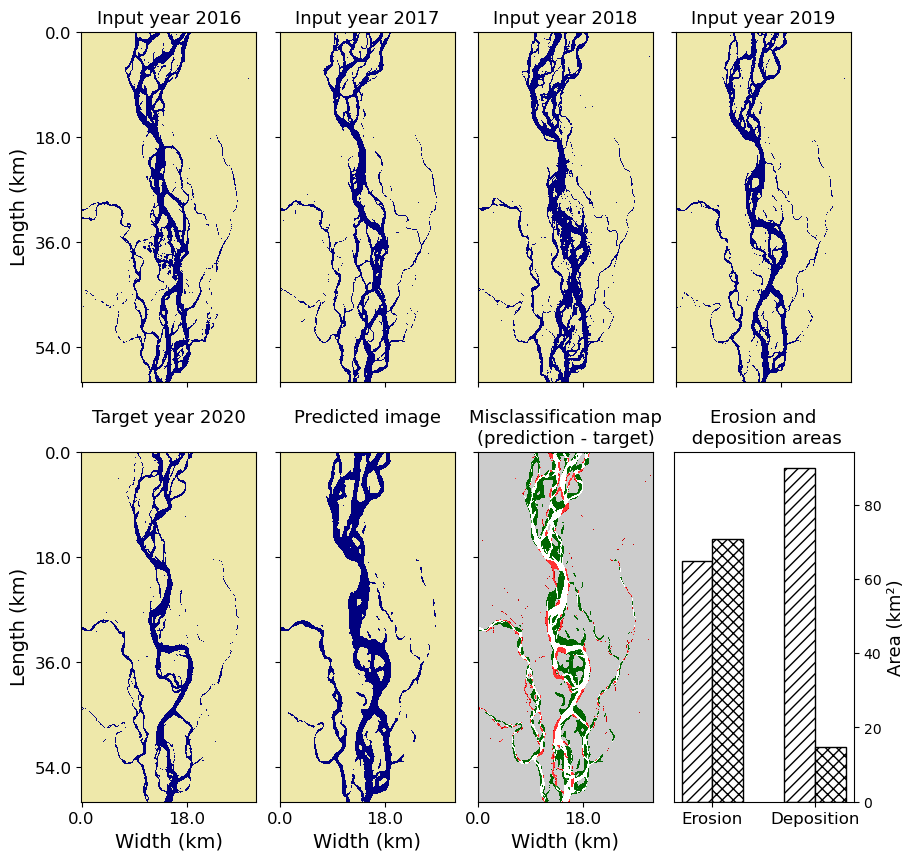

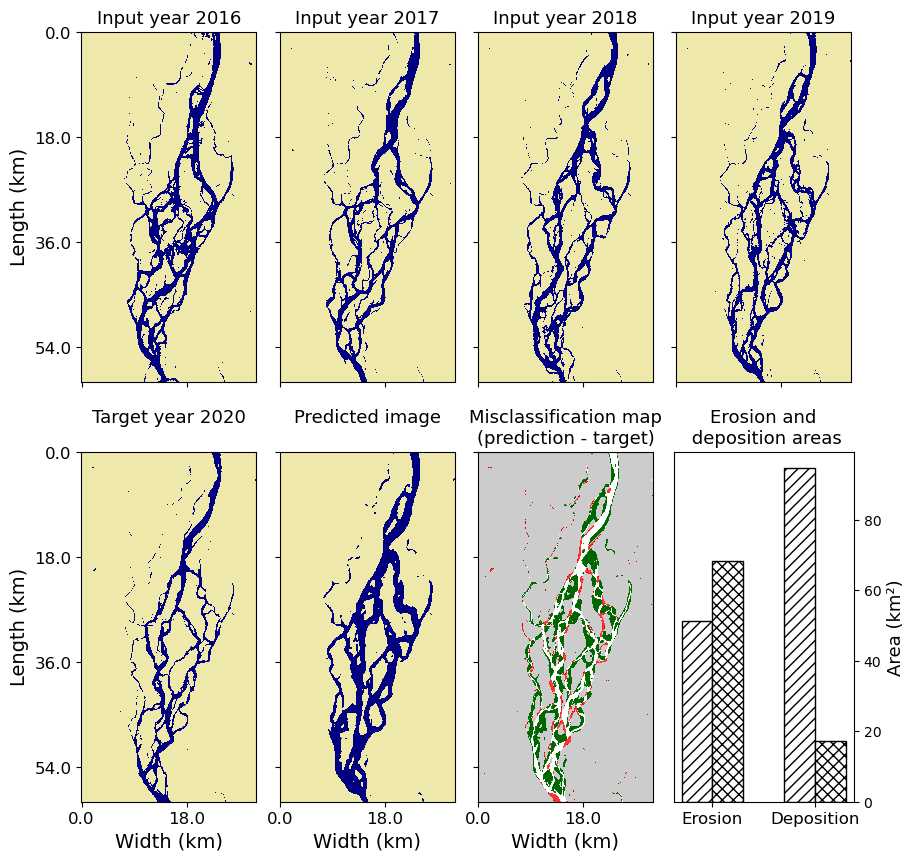

...

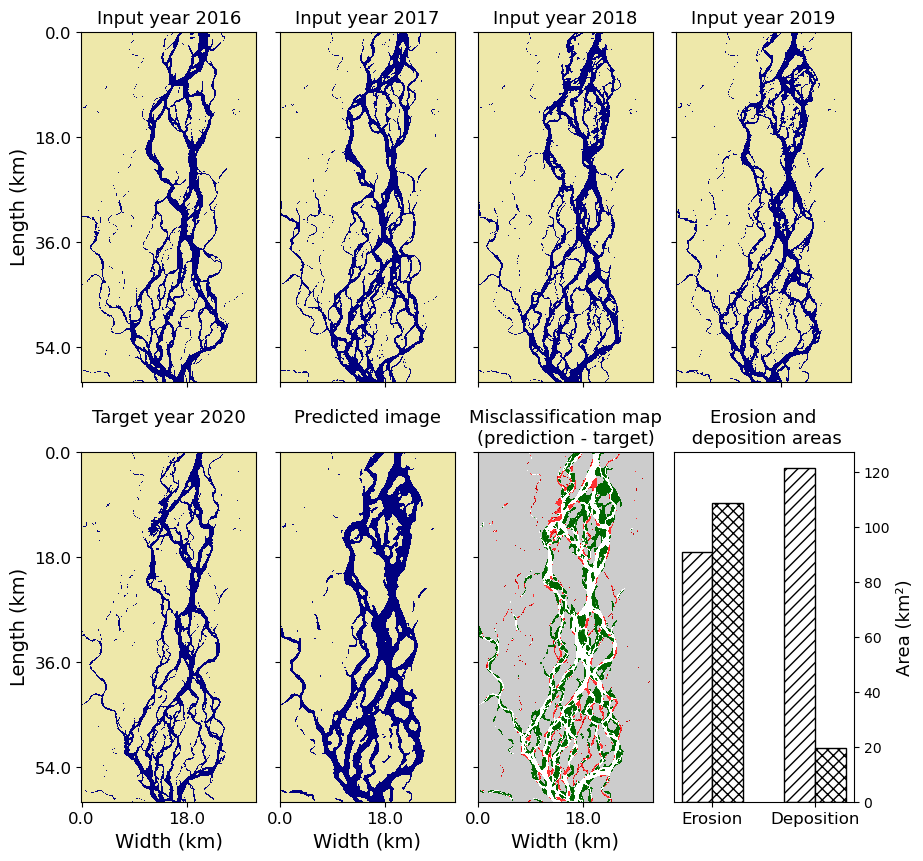

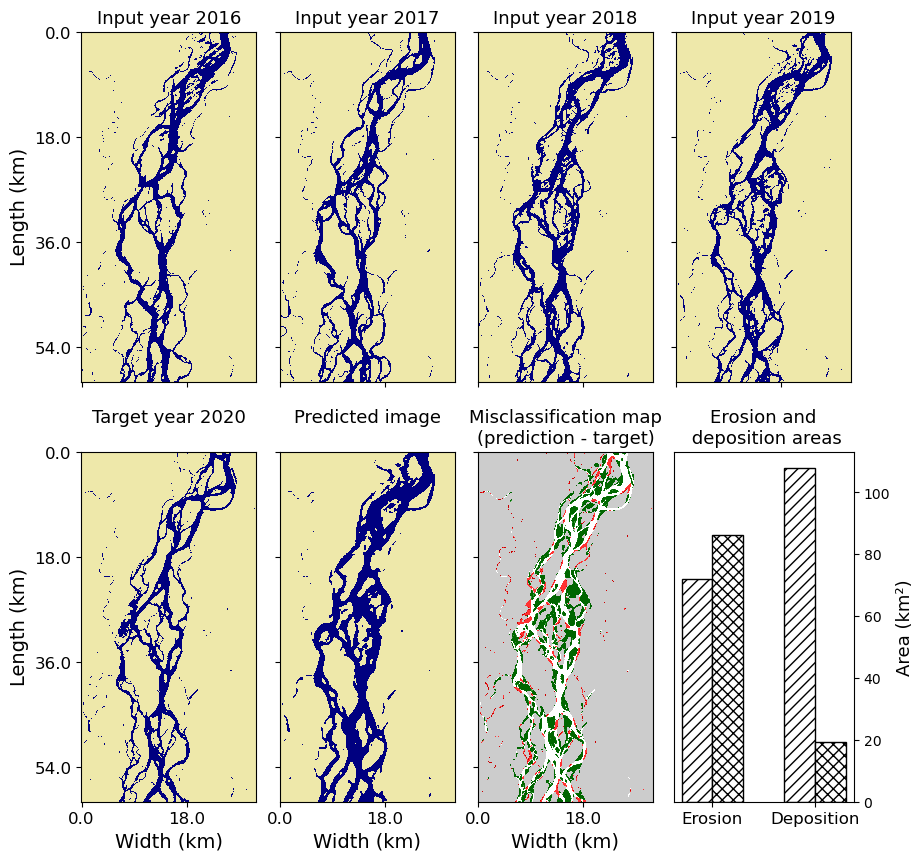

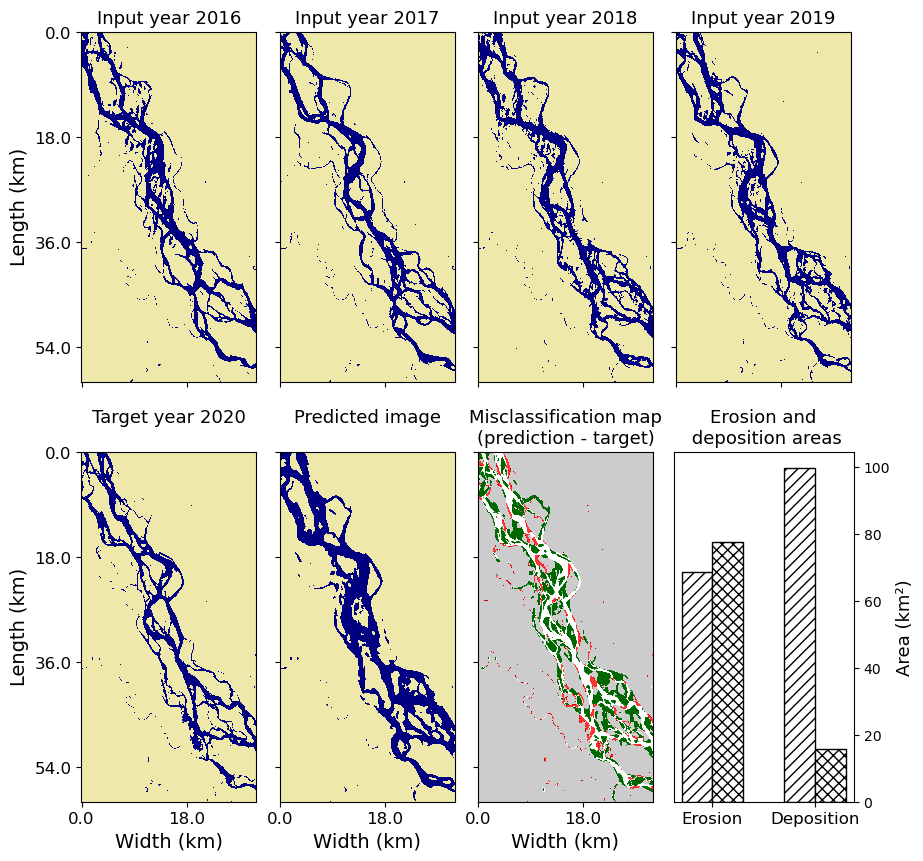

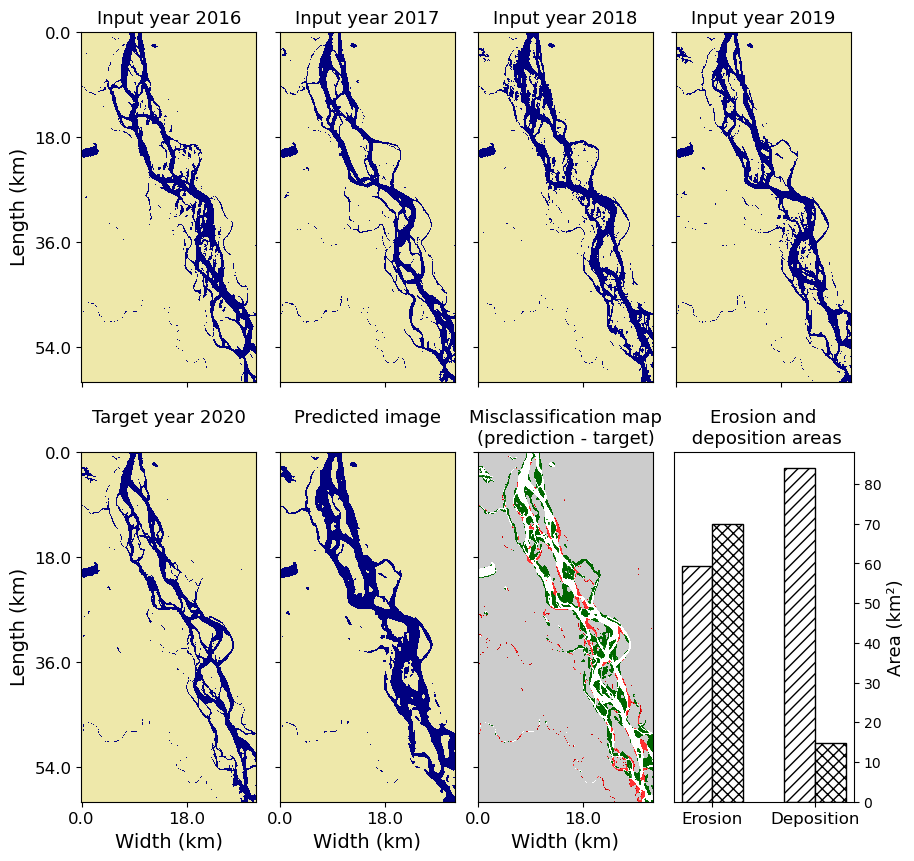

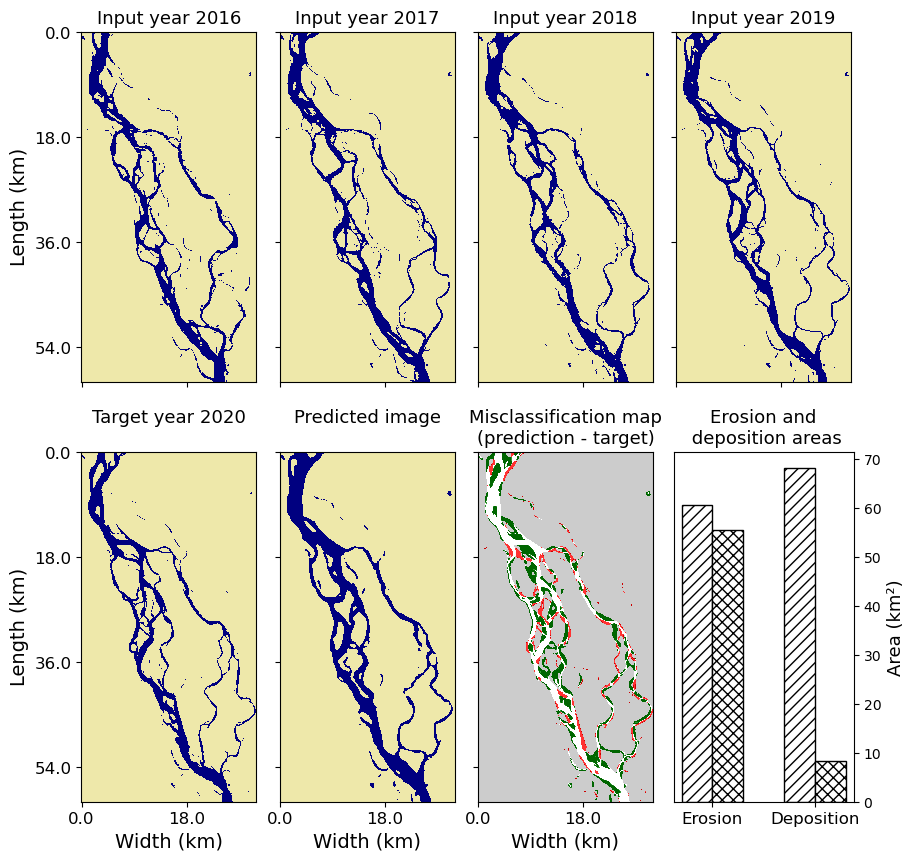

In [25]:
# max recall model

%matplotlib inline
for i in range(len(test_set)):
    show_evolution_nolegend(i, test_set, model_recall, device=device, loss_recall='max recall', spatial_temporal='temporal', save_img=False)

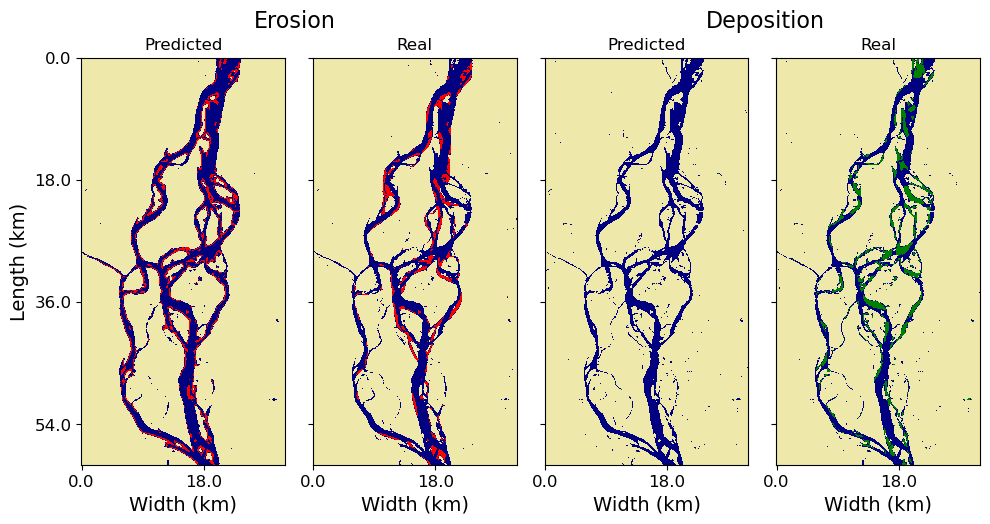

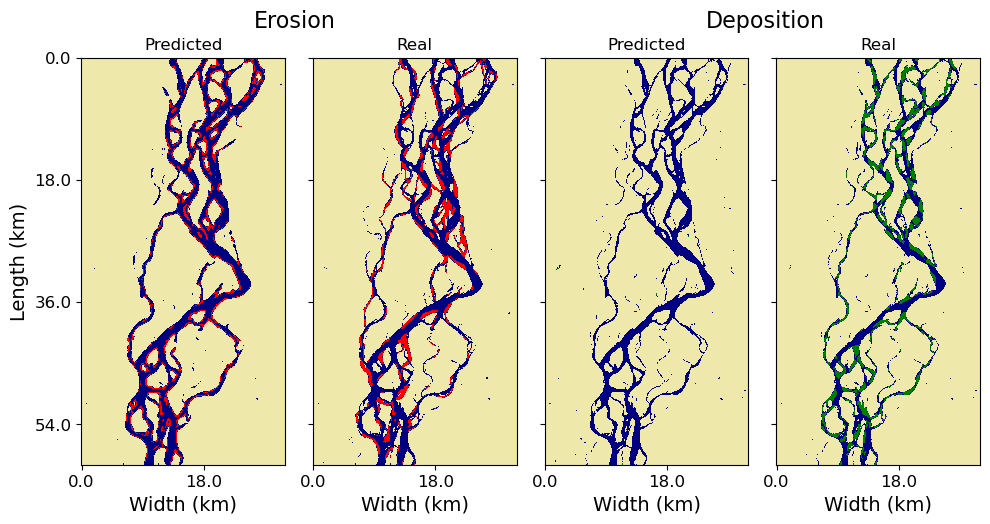

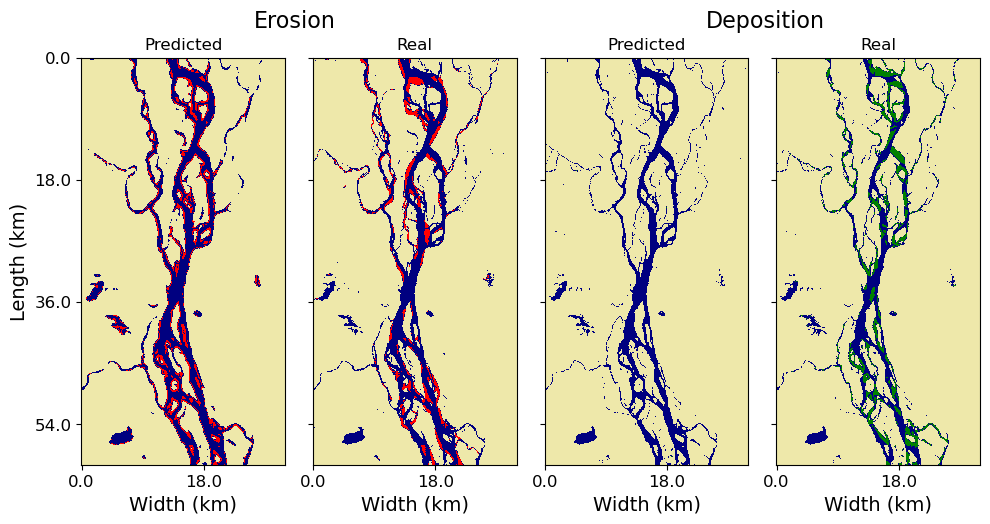

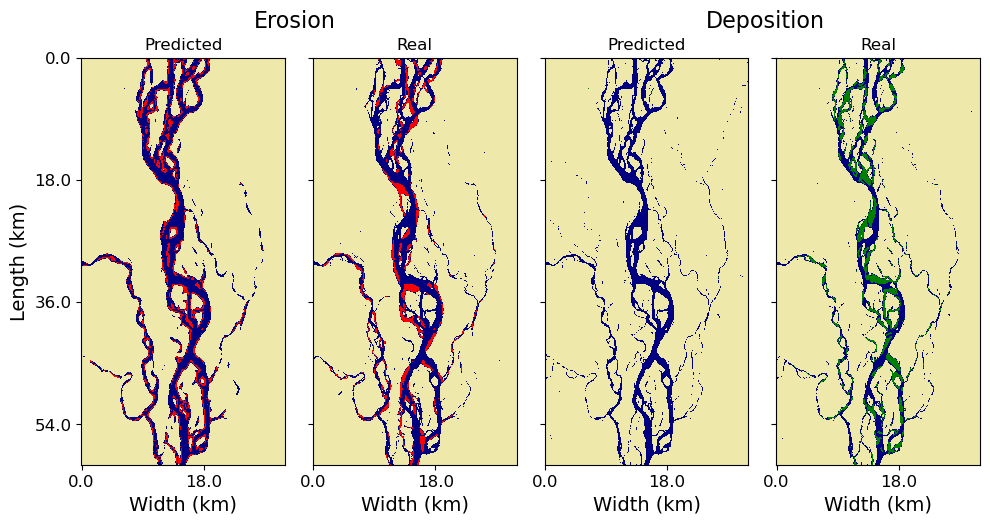

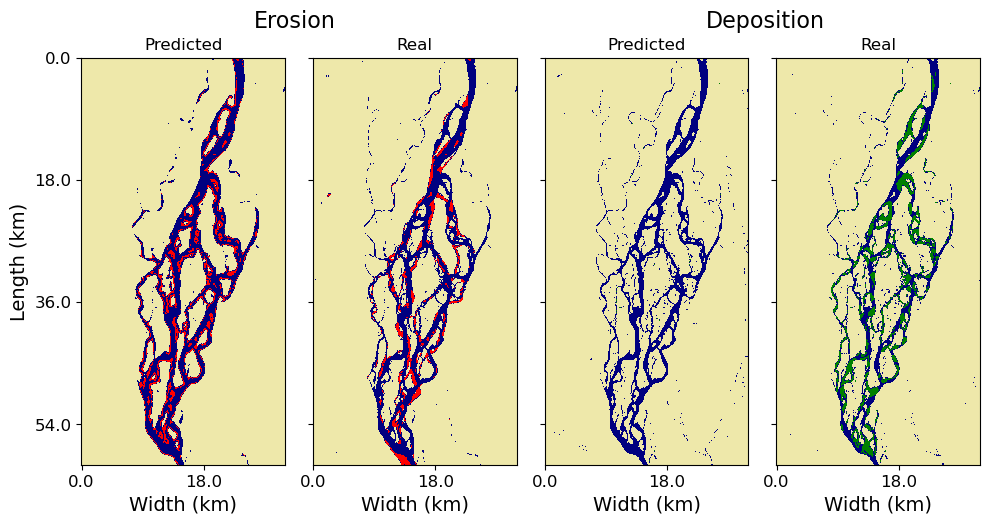

...

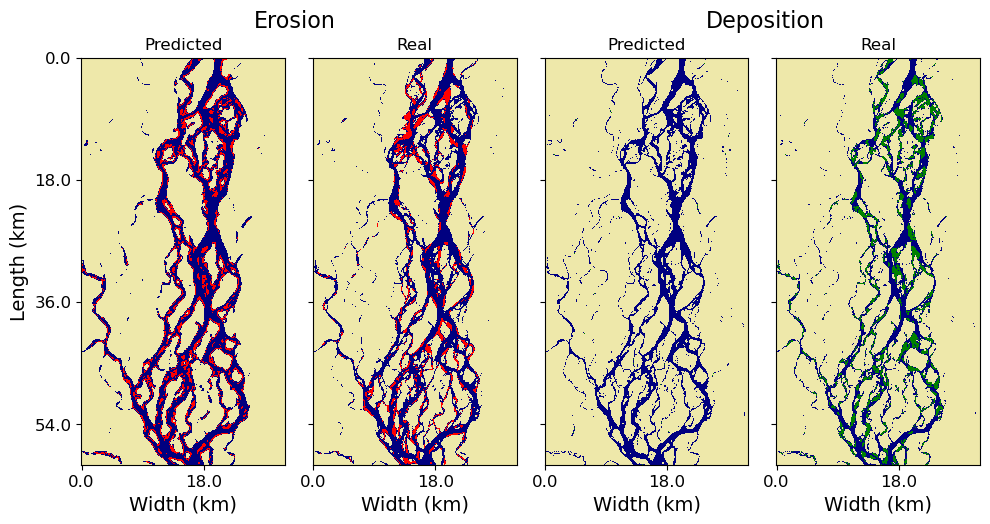

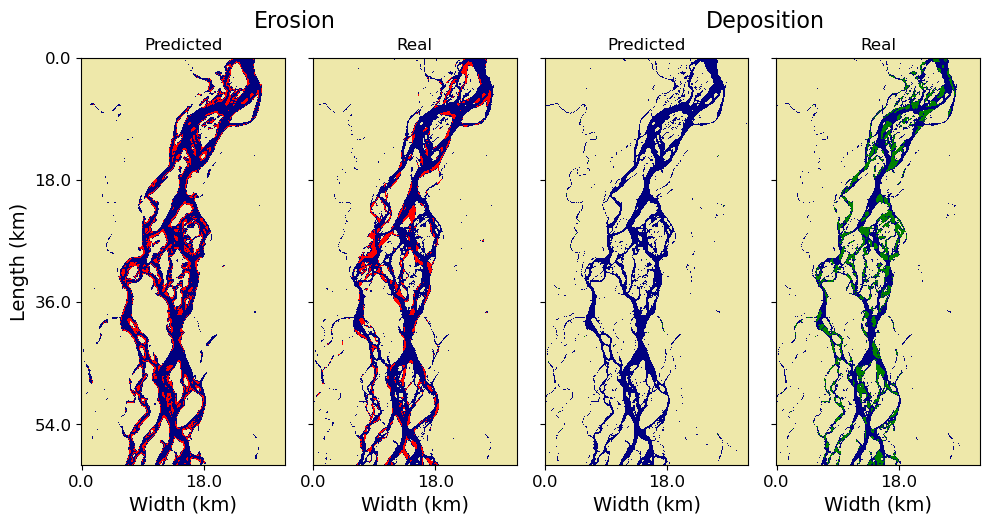

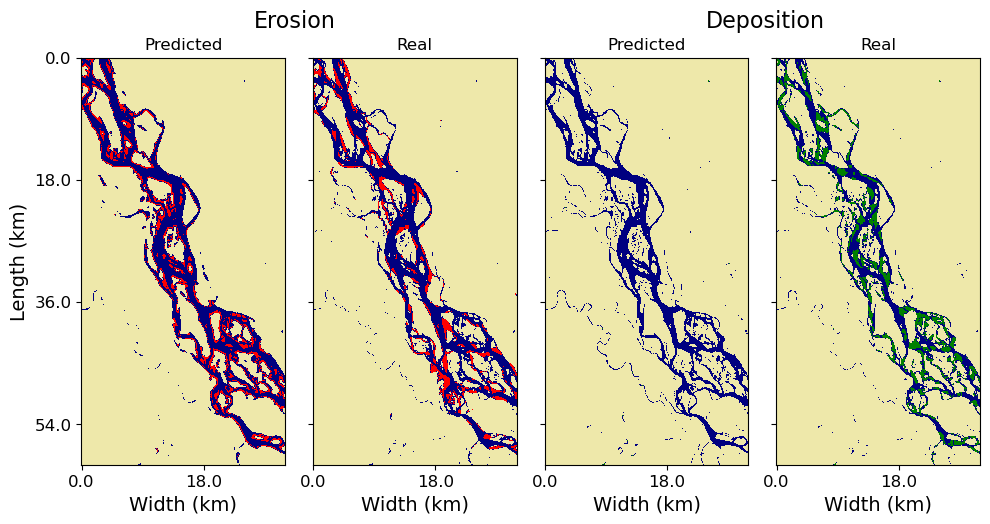

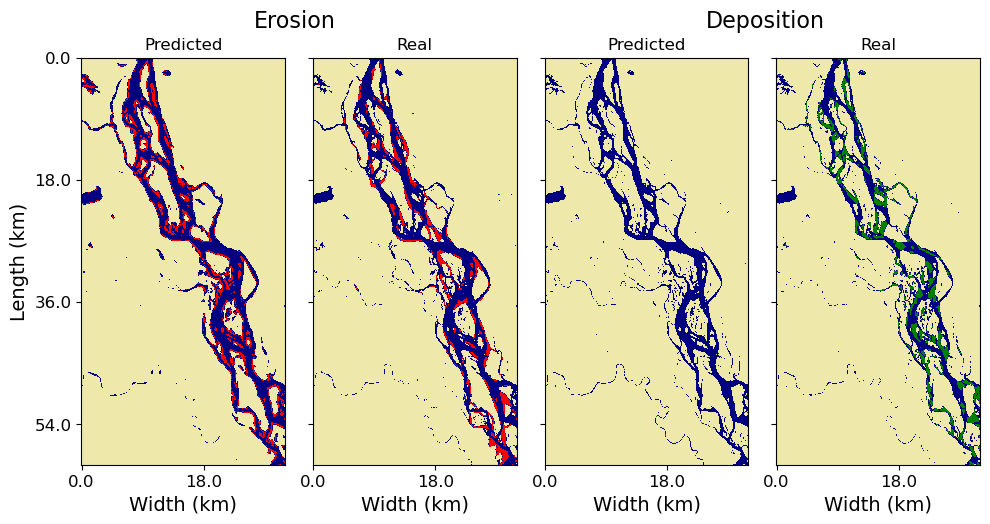

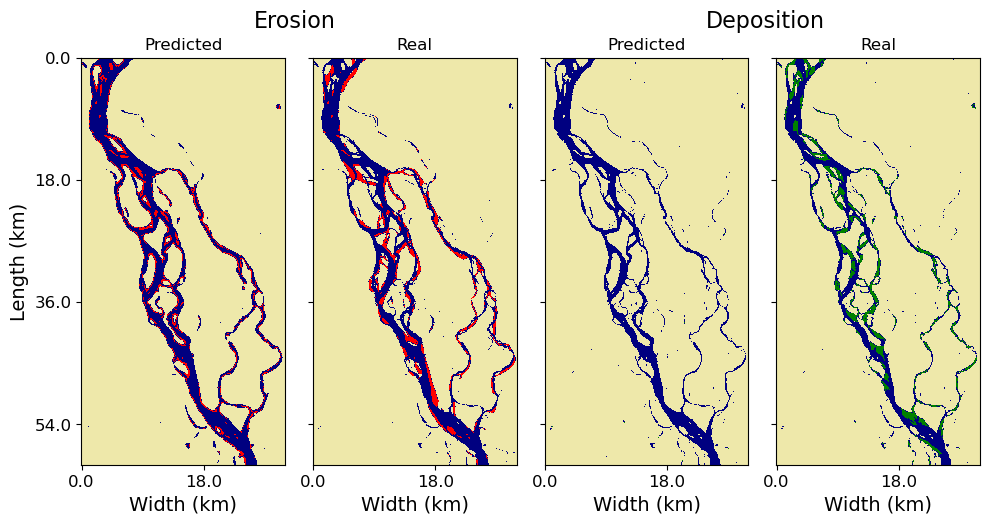

In [24]:
%matplotlib inline
for i in range(len(test_set)):
    erosion_sites(model_recall, test_set, i, device=device, model_type='max recall', spatial_temporal='temporal', save_img=False)

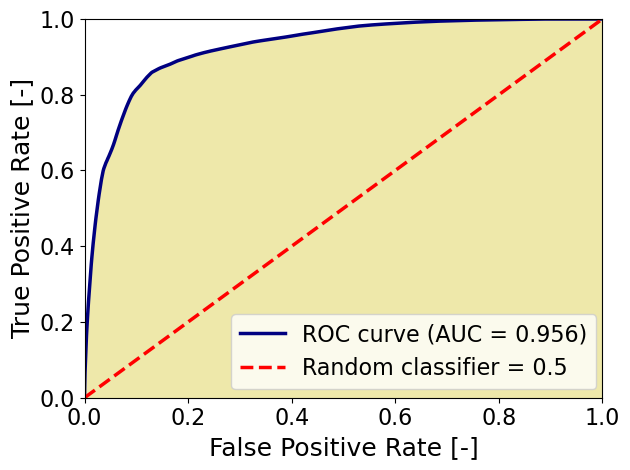

In [69]:
%matplotlib inline
get_total_roc_curve(model_loss, test_set, device=device, spatial_temporal='temporal', save_img=False)

c:\Users\anton\OneDrive\Desktop\jamuna_morpho\postprocessing\metrics.py:211: RuntimeWarning: invalid value encountered in divide
  best_idx = np.argmax(f1_scores)


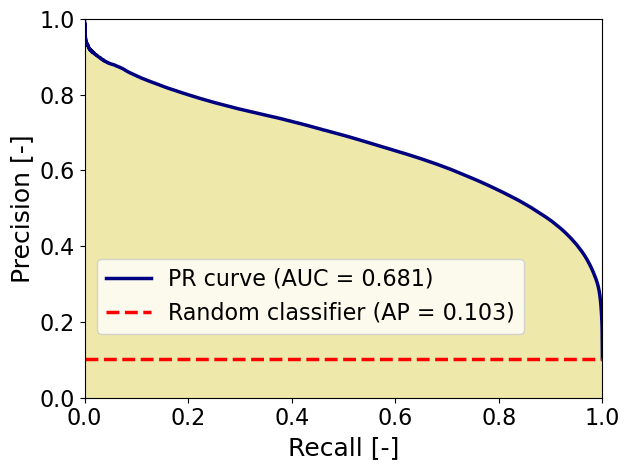

In [70]:
%matplotlib inline
get_total_pr_curve(model_loss, test_set, device=device, spatial_temporal='temporal', save_img=False);

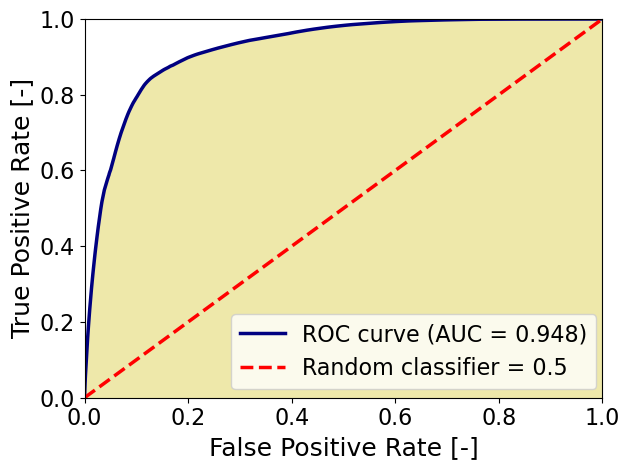

In [71]:
%matplotlib inline
get_total_roc_curve(model_recall, test_set, device=device, model_type='max recall', spatial_temporal='temporal', save_img=False)

c:\Users\anton\OneDrive\Desktop\jamuna_morpho\postprocessing\metrics.py:211: RuntimeWarning: invalid value encountered in divide
  best_idx = np.argmax(f1_scores)
c:\Users\anton\OneDrive\Desktop\jamuna_morpho\postprocessing\metrics.py:211: RuntimeWarning: invalid value encountered in divide
  best_idx = np.argmax(f1_scores)
c:\Users\anton\OneDrive\Desktop\jamuna_morpho\postprocessing\metrics.py:211: RuntimeWarning: invalid value encountered in divide
  best_idx = np.argmax(f1_scores)
c:\Users\anton\OneDrive\Desktop\jamuna_morpho\postprocessing\metrics.py:211: RuntimeWarning: invalid value encountered in divide
  best_idx = np.argmax(f1_scores)
c:\Users\anton\OneDrive\Desktop\jamuna_morpho\postprocessing\metrics.py:211: RuntimeWarning: invalid value encountered in divide
  best_idx = np.argmax(f1_scores)


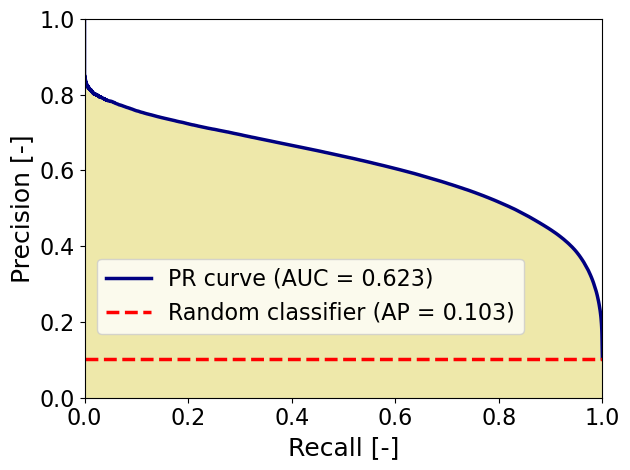

In [72]:
%matplotlib inline
get_total_pr_curve(model_recall, test_set, model_type='max recall', spatial_temporal='temporal', device=device, save_img=True);

In [30]:
# %matplotlib inline
# get_total_balanced_accuracy(model_loss, test_set, device=device, save_img=False)

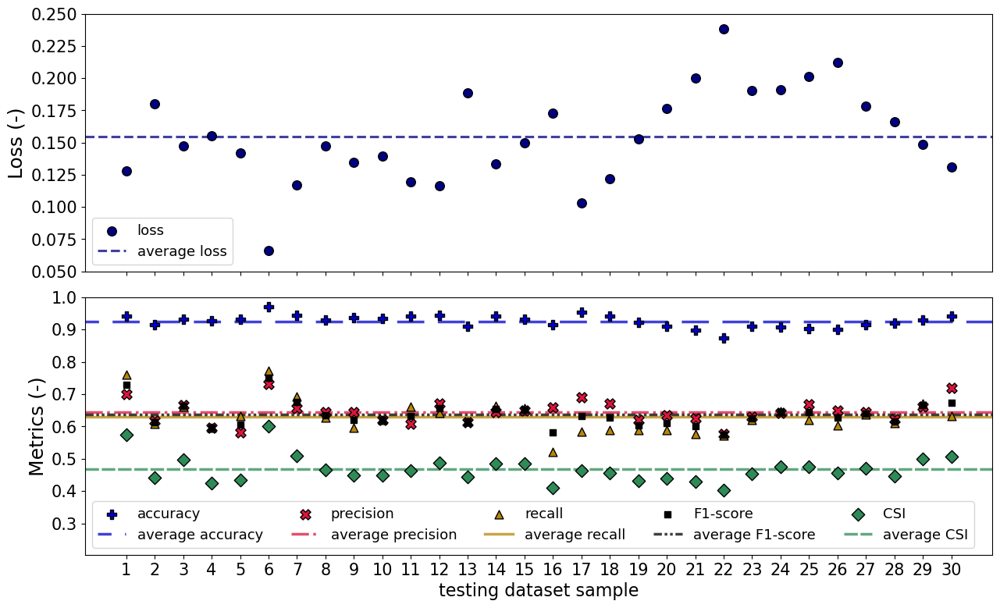

In [80]:
# min loss model

%matplotlib inline
plot_dataset_losses_metrics(model_loss, test_set, device=device, spatial_temporal='temporal', save_img=True)

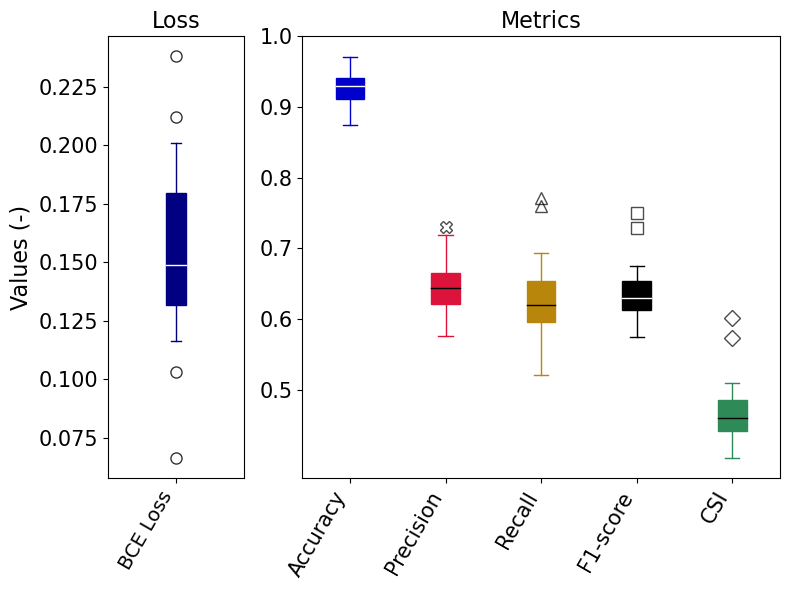

In [81]:
%matplotlib inline
box_plots(model_loss, test_set, device=device, spatial_temporal='temporal', save_img=True)

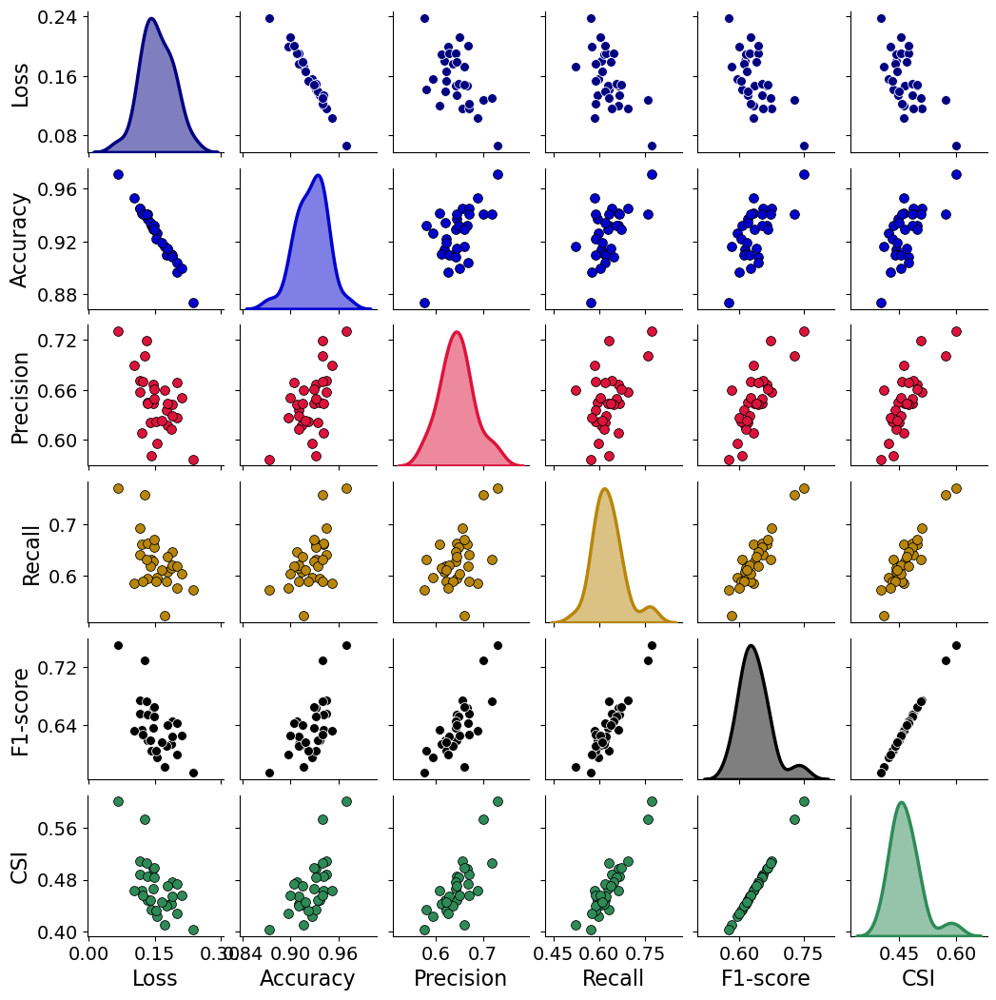

In [33]:
%matplotlib inline
correlation_metrics(model_loss, test_set, device=device, spatial_temporal='temporal', save_img=False)

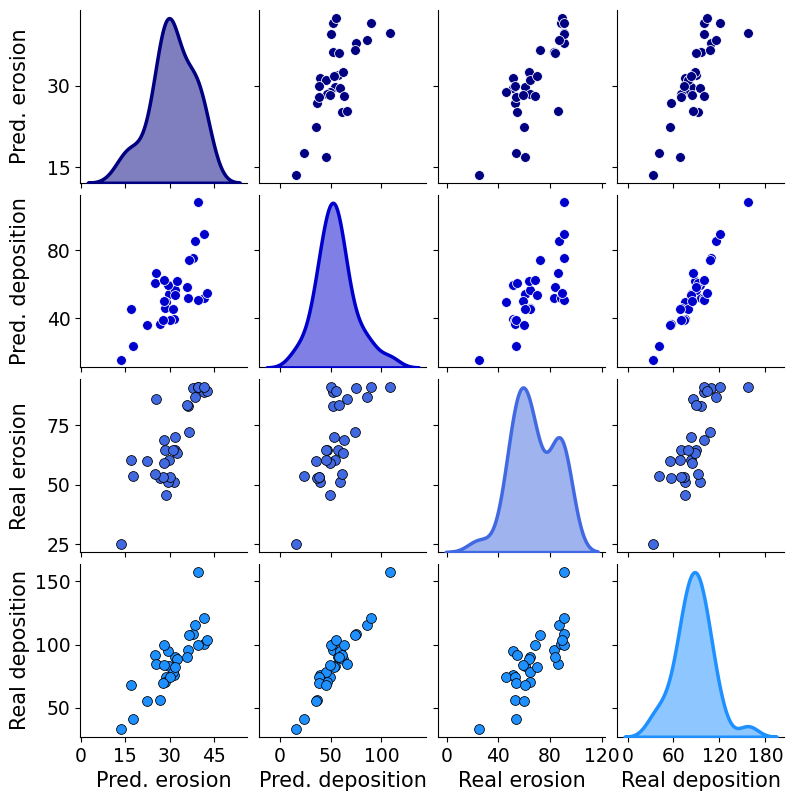

In [34]:
%matplotlib inline
correlation_erdep(model_loss, test_set, device=device, spatial_temporal='temporal', save_img=False)

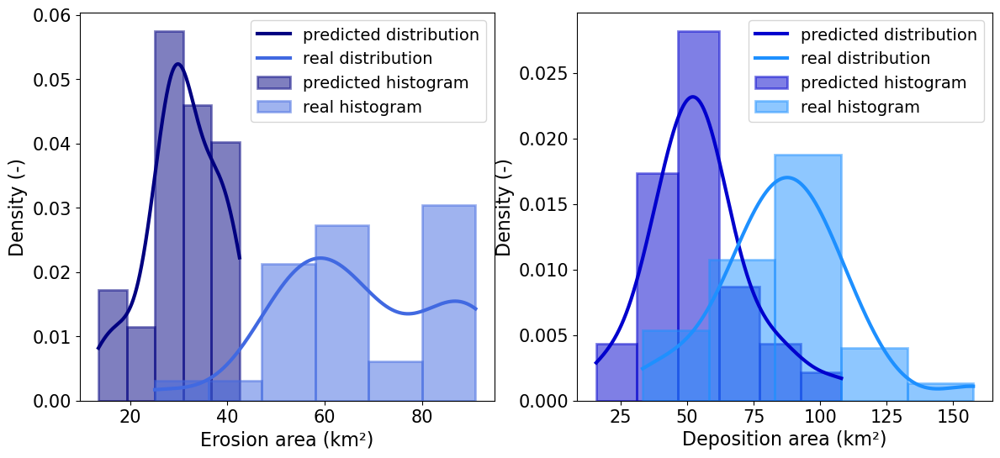

In [35]:
%matplotlib inline
erosion_deposition_distribution(model_loss, test_set, device=device, spatial_temporal='temporal', save_img=True)